This is the simplified version of the original model. Medical information is omitted from the feature list so I can build a web app that takes pure user input to make new predictions. 

# Data wrangling

In [5]:
# Import libraries
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

import numpy as np
import pandas as pd
import geopandas as gpd
import folium

import missingno as msno
from statistics import median
import re

from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import classification_report, roc_auc_score, plot_confusion_matrix
import xgboost as xgb
from xgboost.sklearn import XGBClassifier
import shap
import pickle

import warnings

warnings.simplefilter("ignore")

## Load data
I downloaded the latest data from the Outbreak and Pandemic Preparedness team's [GitHub](https://github.com/beoutbreakprepared/nCoV2019).

In [6]:
# Etra effort to read this file correctly
df = pd.read_csv(
    "latestdata.csv", sep=",", error_bad_lines=False, index_col=False, dtype="unicode",
)
# Rows and columns
df.shape

(266874, 33)

## Clean data

### Target variable
The target variable is each patient's treatment outcome "is_dead" (yes: 1, no: 0).

In [7]:
# Only select patients with known outcome
df_known = df.dropna(subset=["outcome"])

# Value count by outcome
df_known["outcome"].value_counts()

discharge                                                                   161
stable                                                                      156
died                                                                        149
Under treatment                                                             133
discharged                                                                   95
Receiving Treatment                                                          88
recovered                                                                    60
death                                                                        47
stable condition                                                             42
Alive                                                                        14
Dead                                                                         13
Stable                                                                        8
Recovered                               

Since my purpose is predict mortality risk, I converted outcomes to binary: 1 (dead) vs. 0 (not dead).

In [8]:
# New binary outcome: "is_dead"
df_known.loc[:, "is_dead"] = df_known["outcome"].apply(
    lambda x: 1 if x in ["died", "death", "dead", "Dead", "Died", "Death", "Deceased"] else 0
)

### Explanatory variables

In [9]:
# Select relevant variables only
to_keep = [
    "age",
    "sex",
    "symptoms",
    "country",
    "chronic_disease",
    "chronic_disease_binary",
    "is_dead",
]

df_known = df_known[to_keep]

#### 1. Demographic information

In [10]:
# Replace age ranges with medians
df.replace("6 weeks", 0.1, inplace=True)

df_known["age"] = df_known["age"].apply(
    lambda x: median([float(i) for i in str(x).split(sep="-") if i])
)

In [11]:
# Replace "female" with 1 and "male" with 0
df_known["sex"].replace({"female": 1, "male": 0}, inplace=True)

#### 2. Chronic diseases and symptoms
Many patients have more than one chronic disease or symptom. I counted the frequency of each disease and symptom and created binary variables (yes: 1, no: 0) for the most frequent ones.

In [12]:
# Convert "chronic_disease_binary" to numerics
df_known["chronic_disease_binary"] = pd.to_numeric(
    df_known["chronic_disease_binary"], errors="coerce"
)

In [13]:
# Put all dieases in a list
diseases = [disease.split(",") for disease in df_known["chronic_disease"].dropna()]

# Flatten the list
diseases = [item for sublist in diseases for item in sublist]
diseases = " ".join(diseases).split()

# Count frequencies (show top 5)
pd.Series(diseases).str.strip().value_counts().head()

hypertension    34
disease         30
diabetes        22
chronic         14
kidney          13
dtype: int64

By far the most common chronic diseases are hypertension, diabetes, and coronary heart disease.

In [14]:
# One-hot encode hypertension and diabetes
diseases_top2 = ["hypertension", "diabetes"]

for disease in diseases_top2:
    df_known[disease] = df_known["chronic_disease"].apply(
        lambda x: 1 if disease in str(x) else 0
    )

# One-hot encode coronary heart disease
df_known["heart"] = df_known["chronic_disease"].apply(
    lambda x: 1 if "heart" in str(x) or "coronary" in str(x) else 0
)

Let's do the same for symptoms.

In [15]:
# Put all symptoms in a list
symptoms = [symptom.split(",") for symptom in df_known["symptoms"].dropna()]

# Flatten the list
symptoms = [item for sublist in symptoms for item in sublist]

# Count frequencies (show top 5)
pd.Series(symptoms).str.strip().value_counts().head()

fever               88
Mild to moderate    87
cough               58
sore throat         13
fatigue             12
dtype: int64

The most frequent symptoms experienced by COVID-19 patients are fever, cough, fatigue, and sore throat.

In [16]:
# One-hot encode top 4 symptoms
symptoms_top4 = pd.Series(symptoms).str.strip().value_counts().head(4).index.tolist()

for symptom in symptoms_top4:
    df_known[symptom] = df_known["symptoms"].apply(
        lambda x: 1 if symptom in str(x) else 0
    )

Finally, I dropped columns that will no longer be needed.

In [17]:
# Column list
to_drop = ["country", "symptoms", "chronic_disease"]

# Drop from dataframe
df_known.drop(to_drop, axis=1, inplace=True)

Even the cleaned dataset has a large proportion of data missing. Rather than imputing data or dropping cases with missing values, I prefer to use algorithms (e.g., tree-based methods such as XGBoost) that tolerate missing values.

### Test/train split
Before examining how key features relate to the outcome, I split the whole dataset into 20% test and 80% train.

In [18]:
# Target variable: "is_dead"
y = df_known["is_dead"]

# Explanatory variables: all the rest
X = df_known.loc[:, df_known.columns != "is_dead"]

# Create training and testing datasets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=465
)

In [19]:
with open("X.pkl", "wb") as file:
    pickle.dump(X, file)
    
with open("y.pkl", "wb") as file:
    pickle.dump(y, file)    

with open("X_train.pkl", "wb") as file:
    pickle.dump(X_train, file)

with open("y_train.pkl", "wb") as file:
    pickle.dump(y_train, file)
    
with open("X_test.pkl", "wb") as file:
    pickle.dump(X_test, file)

with open("y_test.pkl", "wb") as file:
    pickle.dump(y_test, file)     

## Feature scaling
To make sure features are on the same scale, let's scale age, beds per 10,000, and doctors per 10,000. Because there are outliers, I used `RobustScaler()` instead of `StandardScaler()` or `MinMaxScaler()`.


In [16]:
# Create RobustScaler object
age_scaler = RobustScaler()

In [17]:
# Create RobustScaler object
age_scaler = RobustScaler()

# Transform age
X_train["age"] = age_scaler.fit_transform(X_train[["age"]].values.astype(float))
X_test["age"] = age_scaler.fit_transform(X_test[["age"]].values.astype(float))

# Classify patients
Finally, I'm using features I just engineered to **classify** each patient's outcome. When choosing the right classifier, I'm most concerned with the missingness and the sparsity of observations (only 248 in train and 62 in test) in my data. To address these concerns, I opted to use XGBoost. First of all, XGBoost automatically infers missing values based on existing patterns so I don't have to drop all cases with missing values or impute values in a way that alters patterns in the data. It's also nice that XGBoost has several built-in measures for preventing overfitting (e.g., L1 and L2 penalties, automatic cross-validation), which is important for my small dataset.

## Build an XGBoost classifier
XGBoost has more hyper-parameters than most models. To achieve good performance, it's crucial to find the optimal values for these hyper-parameters. I tried both Bayesian optimization (implemented by `hyperopt`) and traditional grid search and the latter achieved better results. Since grid search can be computationally costly, rather than tuning all hyper-parameters at once, I tuned a couple of parameters at a time.

In [17]:
# Function: Find best estimator
def param_tuning(estimator, parameters, data, target):

    # Set up grid search
    grid_search = GridSearchCV(
        estimator=estimator,
        param_grid=parameters,
        scoring="roc_auc",
        n_jobs=10,
        cv=10,
        verbose=True,
    )

    # Train on training data
    grid_search.fit(data, target)

    # Output best estimator
    return grid_search.best_estimator_


# Function: Train classifier and evaluate performance
def model_fit(model, data_train, data_test, target_train, target_test):

    # Fit on training data
    model.fit(data_train, target_train)

    # Cross validate on training data
    scores = cross_val_score(model, data_train, target_train, cv=10, scoring="roc_auc")
    print("AUC in each fold: {}; mean: {}\n".format(scores, scores.mean()))

    # Predict outcome for testing data
    y_pred = model.predict(data_test)

    # Display performance metrics
    xgb_eval = classification_report(target_test, y_pred, labels=[0, 1])
    print(xgb_eval)

    # Confusion matrix
    plot_confusion_matrix(
        model,
        data_test,
        target_test,
        display_labels=["survived", "dead"],
        cmap=plt.cm.Blues,
        normalize=None,
    )
    plt.title("Confusion matrix")

### 1. Default model

AUC in each fold: [0.97744361 0.85714286 0.79824561 0.92063492 1.         0.92857143
 0.80952381 0.9484127  0.9484127  0.94444444]; mean: 0.9132832080200501

              precision    recall  f1-score   support

           0       0.98      0.83      0.90        53
           1       0.50      0.90      0.64        10

    accuracy                           0.84        63
   macro avg       0.74      0.87      0.77        63
weighted avg       0.90      0.84      0.86        63



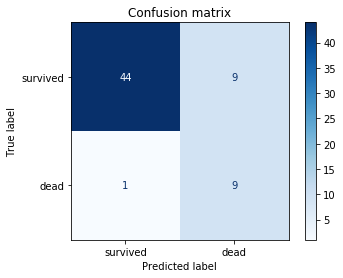

In [18]:
xgb_base = XGBClassifier(
    learning_rate=0.1,
    early_stopping_rounds=10,
    enable_experimental_json_serialization=True,
)
model_fit(xgb_base, X_train, X_test, y_train, y_test)

### 2. Tune `max_depth` and `min_child_weight`

Fitting 10 folds for each of 24 candidates, totalling 240 fits


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done 221 out of 240 | elapsed:    4.3s remaining:    0.4s
[Parallel(n_jobs=10)]: Done 240 out of 240 | elapsed:    4.3s finished


AUC in each fold: [0.98496241 0.87218045 0.84649123 0.92063492 1.         0.92063492
 0.83333333 0.94047619 0.95634921 0.92857143]; mean: 0.9203634085213033

              precision    recall  f1-score   support

           0       0.98      0.85      0.91        53
           1       0.53      0.90      0.67        10

    accuracy                           0.86        63
   macro avg       0.75      0.87      0.79        63
weighted avg       0.91      0.86      0.87        63



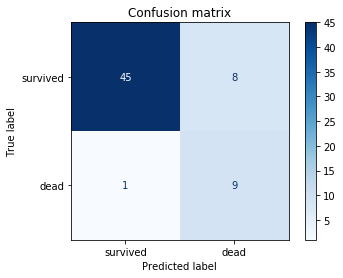

In [19]:
param_step1 = {"max_depth": range(2, 10, 1), "min_child_weight": range(1, 6, 2)}
xgb_step1 = param_tuning(xgb_base, param_step1, X_train, y_train)
model_fit(xgb_step1, X_train, X_test, y_train, y_test)

### 3. Tune `gamma`

Fitting 10 folds for each of 200 candidates, totalling 2000 fits


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.3s
[Parallel(n_jobs=10)]: Done 620 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done 1620 tasks      | elapsed:    8.9s
[Parallel(n_jobs=10)]: Done 1981 out of 2000 | elapsed:   10.9s remaining:    0.1s
[Parallel(n_jobs=10)]: Done 2000 out of 2000 | elapsed:   10.9s finished


AUC in each fold: [0.95488722 0.89097744 0.85964912 0.91666667 1.         0.95634921
 0.87301587 0.97619048 0.95634921 0.94444444]; mean: 0.9328529657477025

              precision    recall  f1-score   support

           0       0.98      0.85      0.91        53
           1       0.53      0.90      0.67        10

    accuracy                           0.86        63
   macro avg       0.75      0.87      0.79        63
weighted avg       0.91      0.86      0.87        63



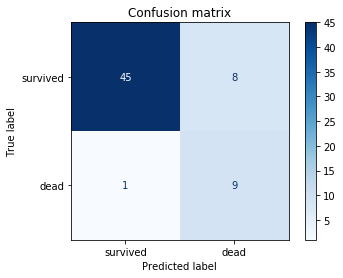

In [20]:
param_step2 = {"gamma": np.arange(0.0, 10.0, 0.05)}
xgb_step2 = param_tuning(xgb_step1, param_step2, X_train, y_train)
model_fit(xgb_step2, X_train, X_test, y_train, y_test)

### 4. Tune `subsample` and `colsample_bytree`

Fitting 10 folds for each of 25 candidates, totalling 250 fits


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.2s finished


AUC in each fold: [0.96240602 0.87218045 0.90789474 0.92460317 1.         0.95634921
 0.87301587 0.98015873 0.96428571 0.96031746]; mean: 0.9401211361737678

              precision    recall  f1-score   support

           0       0.96      0.85      0.90        53
           1       0.50      0.80      0.62        10

    accuracy                           0.84        63
   macro avg       0.73      0.82      0.76        63
weighted avg       0.88      0.84      0.85        63



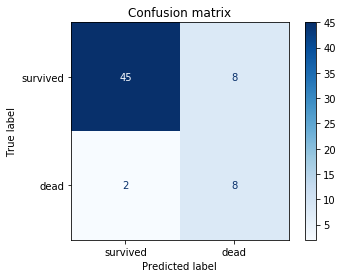

In [21]:
param_step3 = {
    "subsample": [0.5, 0.6, 0.7, 0.8, 0.9],
    "colsample_bytree": [0.5, 0.6, 0.7, 0.8, 0.9],
}
xgb_step3 = param_tuning(xgb_step2, param_step3, X_train, y_train)
model_fit(xgb_step3, X_train, X_test, y_train, y_test)

### 5. Tune `reg_alpha`

Fitting 10 folds for each of 7 candidates, totalling 70 fits


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.3s
[Parallel(n_jobs=10)]: Done  51 out of  70 | elapsed:    0.3s remaining:    0.1s
[Parallel(n_jobs=10)]: Done  70 out of  70 | elapsed:    0.4s finished


AUC in each fold: [0.96240602 0.87218045 0.90789474 0.92460317 1.         0.95634921
 0.87301587 0.98015873 0.96428571 0.96031746]; mean: 0.9401211361737678

              precision    recall  f1-score   support

           0       0.96      0.85      0.90        53
           1       0.50      0.80      0.62        10

    accuracy                           0.84        63
   macro avg       0.73      0.82      0.76        63
weighted avg       0.88      0.84      0.85        63



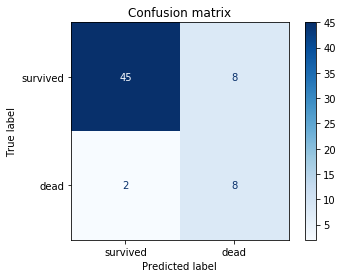

In [22]:
param_step4 = {"reg_alpha": [1e-5, 1e-2, 0.1, 0.5, 1, 5, 100]}
xgb_step4 = param_tuning(xgb_step3, param_step4, X_train, y_train)
model_fit(xgb_step4, X_train, X_test, y_train, y_test)

### 4. Tune `learning_rate`

Fitting 10 folds for each of 99 candidates, totalling 990 fits


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 620 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done 990 out of 990 | elapsed:    4.8s finished


AUC in each fold: [0.96992481 0.87218045 0.90789474 0.92460317 1.         0.95634921
 0.87301587 0.98015873 0.96428571 0.96031746]; mean: 0.940873015873016

              precision    recall  f1-score   support

           0       0.96      0.85      0.90        53
           1       0.50      0.80      0.62        10

    accuracy                           0.84        63
   macro avg       0.73      0.82      0.76        63
weighted avg       0.88      0.84      0.85        63



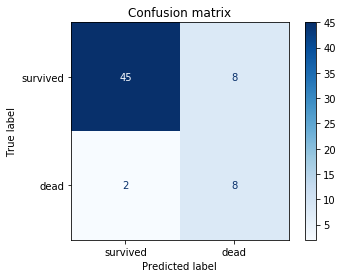

In [23]:
param_step5 = {"learning_rate": np.arange(0.001, 0.1, 0.001)}
xgb_step5 = param_tuning(xgb_step4, param_step5, X_train, y_train)
model_fit(xgb_step5, X_train, X_test, y_train, y_test)

The best model was the last one.

In [24]:
xgb_best = xgb_step5

## Feature importances
While the meat of this project is to predict mortality risk of patients, it's nice to know which features contribute the most to our predictions. In recent years, explainable AI/ML researchers have proposed many methods for getting **accurate** and **consistent** feature importances out of a "black box" model. One such method is called [SHAP](https://towardsdatascience.com/interpretable-machine-learning-with-xgboost-9ec80d148d27) ("SHapley Additive exPlanations"), which uses Shapley values to allocate credit to features (see this [NeurIPS paper](http://papers.nips.cc/paper/7062-a-unified-approach-to-interpreting-model-predictions) for details).

In [18]:
shap.initjs()
explainer = shap.TreeExplainer(xgb_best)
shap_values = explainer.shap_values(X_test)
shap.force_plot(explainer.expected_value, shap_values[0, :], X_test.iloc[0, :])

NameError: name 'xgb_best' is not defined

Not only does SHAP tell us which features are most important, it also shows us the direction of influence. The most influential feature is age: The older a patient, the higher the risk. The second most influential feature is doctors per 10,000 residents. However, it doesn't have a linear relationship with mortality risk: When the number is very low, mortality risk is high; however, countries with many doctors per 10,000 seemed to be more "dangerous" than those with a middling number. My theory is that countries with most medical resources are also the most popular destinations with the most cases, which complicates the relationship between medical resources and patient outcomes.

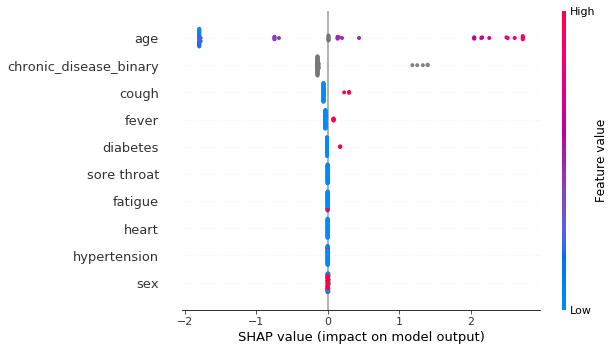

In [26]:
shap.summary_plot(shap_values, X_test)

## Retrain on full dataset
Since we only have a few hundred cases, before using the classifier to make new predictions, let's train it on the full set of data. Like before, we can cross validate the new model and look at feature importances.

In [27]:
# Scale age, docs per 10,000, and beds per 10,000
X["age"] = age_scaler.fit_transform(X[["age"]].values.astype(float))

In [28]:
# Retrain on full dataste
xgb_best.fit(X, y)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.6,
              early_stopping_rounds=10,
              enable_experimental_json_serialization=True, gamma=4.5,
              learning_rate=0.099, max_delta_step=0, max_depth=2,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=1e-05, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=0.7, verbosity=1)

In [29]:
# Cross validation
y_pred_all = xgb_best.predict(X)
xgb_eval_all = classification_report(y, y_pred_all, labels=[0, 1])
print(xgb_eval_all)

              precision    recall  f1-score   support

           0       0.93      0.94      0.93       236
           1       0.81      0.77      0.79        79

    accuracy                           0.90       315
   macro avg       0.87      0.86      0.86       315
weighted avg       0.90      0.90      0.90       315



Text(0.5, 1.0, 'Confusion matrix')

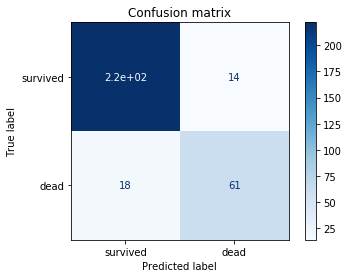

In [30]:
# Confusion matrix
plot_confusion_matrix(
    xgb_best,
    X,
    y,
    display_labels=["survived", "dead"],
    cmap=plt.cm.Blues,
    normalize=None,
)
plt.title("Confusion matrix")

In [31]:
# SHAP
shap.initjs()
explainer = shap.TreeExplainer(xgb_best)
shap_values = explainer.shap_values(X)
shap.force_plot(explainer.expected_value, shap_values[0, :], X.iloc[0, :])

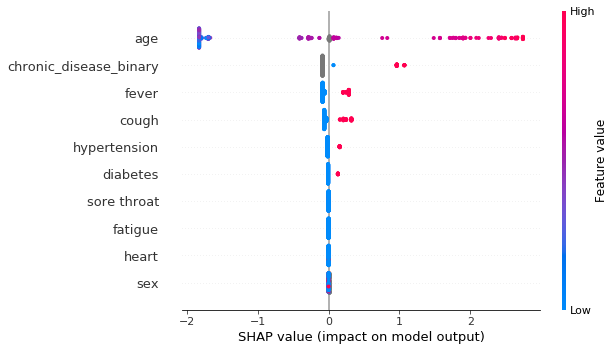

In [32]:
shap.summary_plot(shap_values, X)

## Pickle data and models

In [33]:
# Save models
with open("classifier.pkl", "wb") as file:
    pickle.dump(xgb_best, file)

with open("age_scaler.pkl", "wb") as file:
    pickle.dump(age_scaler, file)

In [ ]:
# Save test and training data
with open("dtrain.pkl", "wb") as file:
    pickle.dump(X_train, file)
    
with open("dtest.pkl", "wb") as file:
    pickle.dump(X_test, file)    

with open("dfull.pkl", "wb") as file:
    pickle.dump(X, file)    
    
with open("ytrain.pkl", "wb") as file:
    pickle.dump(y_train, file)
    
with open("ytest.pkl", "wb") as file:
    pickle.dump(y_test, file)    
    
with open("yfull.pkl", "wb") as file:
    pickle.dump(y, file)   

In [34]:
xgb_best.get_booster().feature_names

['age',
 'sex',
 'chronic_disease_binary',
 'hypertension',
 'diabetes',
 'heart',
 'fever',
 'cough',
 'fatigue',
 'sore throat']

In [50]:
xgb_best.save_model("classifier.json")

In [36]:
with open("classifier", "wb") as fd:
    pickle.dump(xgb_best, fd)

In [54]:
type(xgb_best)

xgboost.sklearn.XGBClassifier

## Predict your risk

### New input

In [37]:
# Function: Take patient info
def patient_info():

    # Demographic info
    age = input("What's your age?")
    sex = input("What's your biological sex? (female: 1, male: 0)")

    # Pre-conditions
    preconition = input("Any chronic dieases that you know of? (yes: 1, no: 0)")
    hypertension = input("Do you have hypertension? (yes: 1, no: 0)")
    diabetes = input("Do you have diabetes? (yes: 1, no: 0)")
    heart = input("Do you have heart diseases? (yes: 1, no: 0)")

    # Symptoms
    fever = input("Do you have fever? (yes: 1, no: 0)")
    cough = input("Are you coughing? (yes: 1, no: 0)")
    fatigue = input("Do you feel fatigue? (yes: 1, no: 0)")
    sore_throat = input("Do you have a sore throat? (yes: 1 , no:0)")

    # Save results in a list
    return {
        "age": float(age_scaler.transform([[age]])),
        "sex": int(sex),
        "chronic_disease_binary": int(preconition),
        "hypertension": int(hypertension),
        "diabetes": int(diabetes),
        "heart": int(heart),
        "fever": int(fever),
        "cough": int(cough),
        "fatigue": int(fatigue),
        "sore throat": int(sore_throat),
    }


# Function: Output risk
def risk_predictor():

    # Get patient info
    new_case = patient_info()

    # Convert to useable format
    new_case = pd.DataFrame(new_case, index=[0])

    # Make prediction
    new_prediction = xgb_best.predict_proba(new_case)

    # Print result
    print(
        "Once contracted COVID-19, your mortality risk is {}%.".format(
            round(new_prediction.tolist()[0][1] * 100, 2)
        )
    )

### Try it yourself!
Answer a few questions to predict your own risk!

In [43]:
import json
import os
import argparse
import numpy as np
import xgboost
import warnings

In [44]:
def save_label_encoder(le):
    """Save the label encoder in XGBClassifier"""
    meta = dict()
    for k, v in le.__dict__.items():
        if isinstance(v, np.ndarray):
            meta[k] = v.tolist()
        else:
            meta[k] = v
    return meta


def xgboost_skl_90to100(skl_model):
    """Extract the model and related metadata in SKL model."""
    model = {}
    with open(skl_model, "rb") as fd:
        old = pickle.load(fd)
        if not isinstance(old, xgboost.XGBModel):
            raise TypeError("The script only handes Scikit-Learn interface object")

    # Save Scikit-Learn specific Python attributes into a JSON document.
    for k, v in old.__dict__.items():
        if k == "_le":
            model[k] = save_label_encoder(v)
        elif k == "classes_":
            model[k] = v.tolist()
        elif k == "_Booster":
            continue
        else:
            try:
                json.dumps({k: v})
                model[k] = v
            except TypeError:
                warnings.warn(str(k) + " is not saved in Scikit-Learn meta.")
    booster = old.get_booster()
    # Store the JSON serialization as an attribute
    booster.set_attr(scikit_learn=json.dumps(model))

    # Save it into a native model.
    i = 0
    while True:
        path = "xgboost_native_model_from_" + skl_model + "-" + str(i) + ".bin"
        if os.path.exists(path):
            i += 1
            continue
        booster.save_model(path)
        break

In [47]:
xgboost_skl_90to100("classifier.pkl")

In [55]:
input_variables = pd.DataFrame(
    [[-0.9, 1, 0, 1, 0, 0, 1, 0, 1, 1]],
    columns=[
        "age",
        "sex",
        "chronic_disease_binary",
        "hypertension",
        "diabetes",
        "heart",
        "fever",
        "cough",
        "fatigue",
        "sore throat",
    ],
    dtype=float,
    index=["input"],
)

In [56]:
input_variables

,age,sex,chronic_disease_binary,hypertension,diabetes,heart,fever,cough,fatigue,sore throat
input,-0.9,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0
